# Classify games outcome by looking at the first 10min worth of data

## EDA

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [2]:
data = pd.read_csv('../datasets/high_diamond_ranked_10min.csv')

In [3]:
data.head()

,gameId,blueWins,blueWardsPlaced,blueWardsDestroyed,blueFirstBlood,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons,...,redTowersDestroyed,redTotalGold,redAvgLevel,redTotalExperience,redTotalMinionsKilled,redTotalJungleMinionsKilled,redGoldDiff,redExperienceDiff,redCSPerMin,redGoldPerMin
0,4519157822,0,28,2,1,9,6,11,0,0,...,0,16567,6.8,17047,197,55,-643,8,19.7,1656.7
1,4523371949,0,12,1,0,5,5,5,0,0,...,1,17620,6.8,17438,240,52,2908,1173,24.0,1762.0
2,4521474530,0,15,0,0,7,11,4,1,1,...,0,17285,6.8,17254,203,28,1172,1033,20.3,1728.5
3,4524384067,0,43,1,0,4,5,5,1,0,...,0,16478,7.0,17961,235,47,1321,7,23.5,1647.8
4,4436033771,0,75,4,0,6,6,6,0,0,...,0,17404,7.0,18313,225,67,1004,-230,22.5,1740.4


In [4]:
data.shape

(9879, 40)

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9879 entries, 0 to 9878
Data columns (total 40 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   gameId                        9879 non-null   int64  
 1   blueWins                      9879 non-null   int64  
 2   blueWardsPlaced               9879 non-null   int64  
 3   blueWardsDestroyed            9879 non-null   int64  
 4   blueFirstBlood                9879 non-null   int64  
 5   blueKills                     9879 non-null   int64  
 6   blueDeaths                    9879 non-null   int64  
 7   blueAssists                   9879 non-null   int64  
 8   blueEliteMonsters             9879 non-null   int64  
 9   blueDragons                   9879 non-null   int64  
 10  blueHeralds                   9879 non-null   int64  
 11  blueTowersDestroyed           9879 non-null   int64  
 12  blueTotalGold                 9879 non-null   int64  
 13  blu

In [6]:
data.iloc[:, 2:20].columns

Index(['blueWardsPlaced', 'blueWardsDestroyed', 'blueFirstBlood', 'blueKills',
       'blueDeaths', 'blueAssists', 'blueEliteMonsters', 'blueDragons',
       'blueHeralds', 'blueTowersDestroyed', 'blueTotalGold', 'blueAvgLevel',
       'blueTotalExperience', 'blueTotalMinionsKilled',
       'blueTotalJungleMinionsKilled', 'blueGoldDiff', 'blueExperienceDiff',
       'blueCSPerMin'],
      dtype='object')

In [7]:
data.iloc[:, 21:].columns

Index(['redWardsPlaced', 'redWardsDestroyed', 'redFirstBlood', 'redKills',
       'redDeaths', 'redAssists', 'redEliteMonsters', 'redDragons',
       'redHeralds', 'redTowersDestroyed', 'redTotalGold', 'redAvgLevel',
       'redTotalExperience', 'redTotalMinionsKilled',
       'redTotalJungleMinionsKilled', 'redGoldDiff', 'redExperienceDiff',
       'redCSPerMin', 'redGoldPerMin'],
      dtype='object')

In [8]:
# check game id duplicated
# each gameid repesect one game, so we can drop out this column
# teart as index 
len(data['gameId'].unique())

9879

In [9]:
# target variable
data['blueWins'].value_counts()

0    4949
1    4930
Name: blueWins, dtype: int64

### Data cleaning / Manipulation

In [10]:
# gameId indicater each row is one single game
# we dont need this information
data = data.drop(columns='gameId')

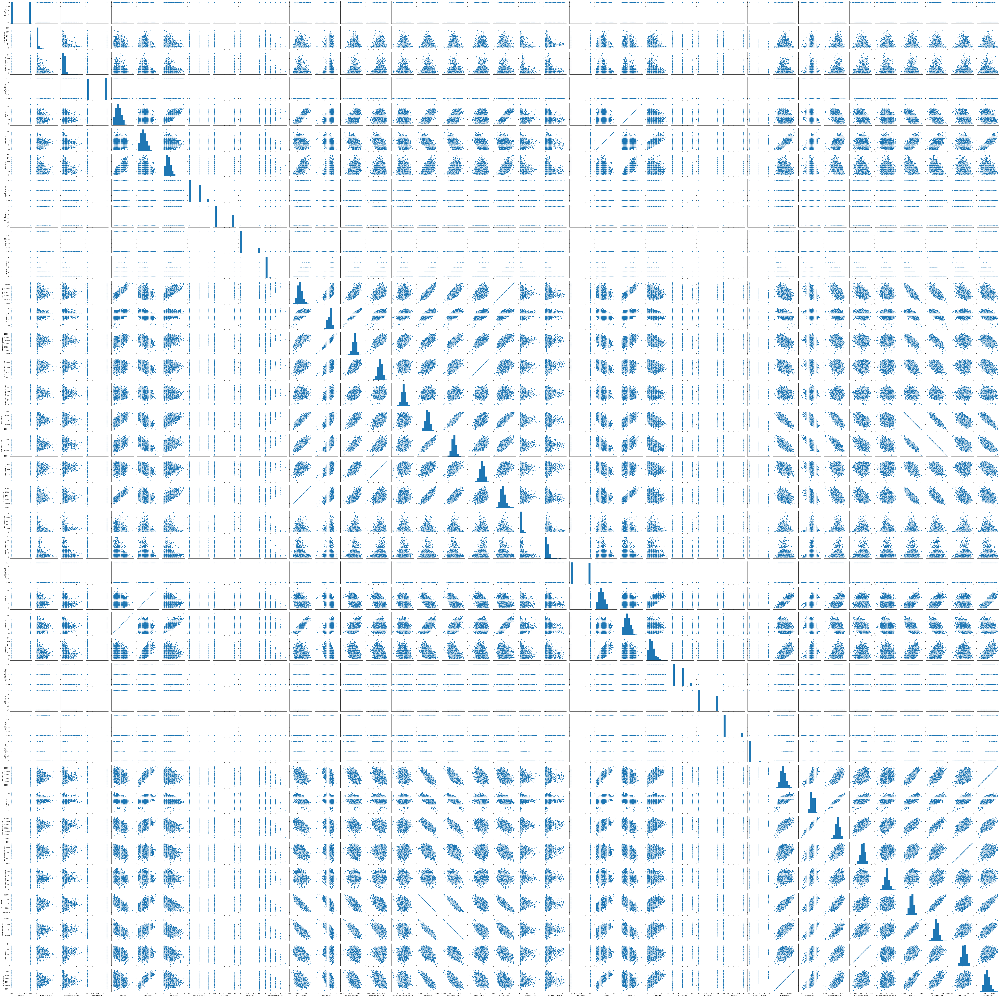

In [11]:
sns.pairplot(data)

In [12]:
corr = data.corr() #make correlation for pet

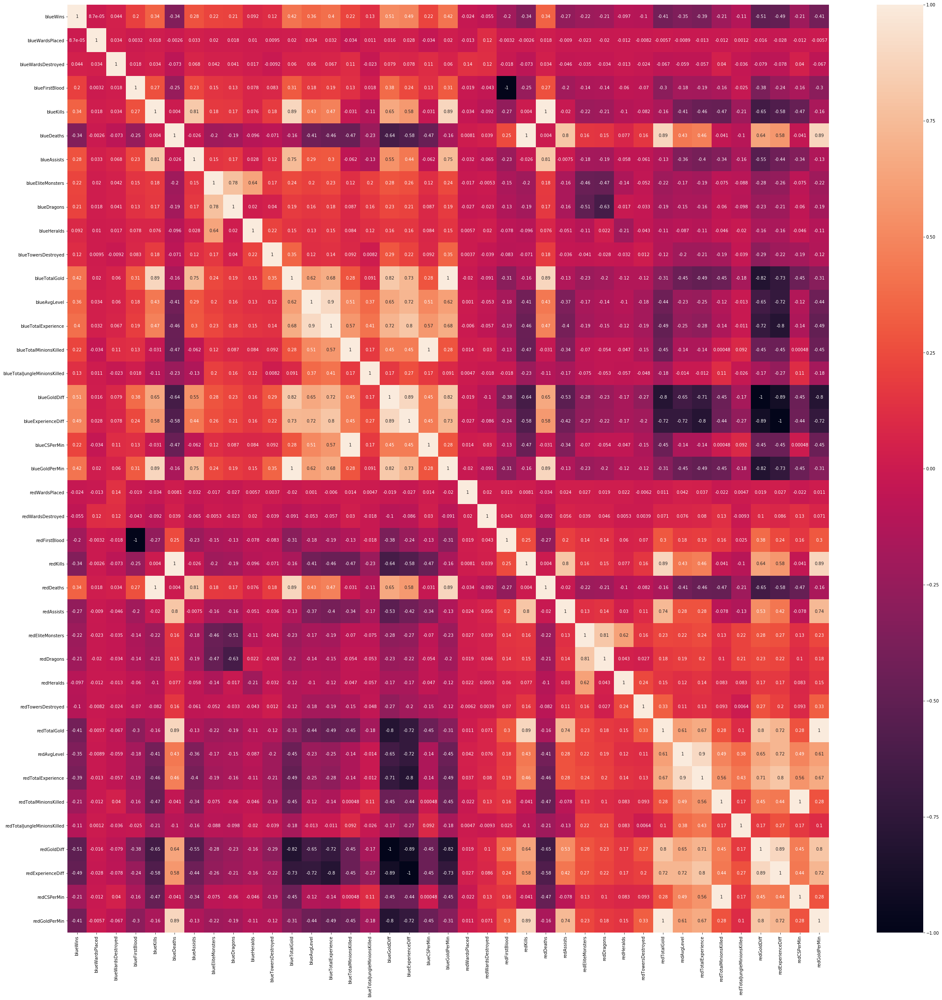

In [13]:
plt.figure(figsize=(40,40))
sns.heatmap(corr, annot = True)
plt.show()

In [14]:
# dealing with the columns which have -1 or 1 corrlation
columns = data.columns

In [15]:
for i in columns:
    for j in columns:
        if abs(data[i].corr(data[j])) >= 0.95:
            if i != j:
                print([i, j, data[i].corr(data[j])])
                columns = columns.drop(i)

['blueFirstBlood', 'redFirstBlood', -1.0]
['blueKills', 'redDeaths', 1.0]
['blueDeaths', 'redKills', 1.0]
['blueTotalGold', 'blueGoldPerMin', 1.0]
['blueTotalMinionsKilled', 'blueCSPerMin', 1.0]
['blueGoldDiff', 'redGoldDiff', -1.0]
['blueExperienceDiff', 'redExperienceDiff', -1.0]
['redTotalGold', 'redGoldPerMin', 1.0]
['redTotalMinionsKilled', 'redCSPerMin', 0.9999999999999996]


In [16]:
# dealing with corr = 1

In [17]:
# it just as get_dummies function, make first blood become blue team and red team
data[['blueFirstBlood', 'redFirstBlood']]

,blueFirstBlood,redFirstBlood
0,1,0
1,0,1
2,0,1
3,0,1
4,0,1
...,...,...
9874,1,0
9875,0,1
9876,0,1
9877,1,0


In [18]:
# make blueFirstBlood binary, 1 mean blue team get, 0 mean red team get
data = data.drop(columns = ['redFirstBlood'])

In [19]:
data[['blueKills', 'redDeaths','blueDeaths', 'redKills']]

,blueKills,redDeaths,blueDeaths,redKills
0,9,9,6,6
1,5,5,5,5
2,7,7,11,11
3,4,4,5,5
4,6,6,6,6
...,...,...,...,...
9874,7,7,4,4
9875,6,6,4,4
9876,6,6,7,7
9877,2,2,3,3


In [20]:
print((data['blueKills'] == data['redDeaths']).value_counts())

print((data['blueDeaths'] == data['redKills']).value_counts())

True    9879
dtype: int64
True    9879
dtype: int64


In [21]:
data = data.drop(columns = ['redDeaths', 'redKills'])

In [22]:
data[['blueGoldPerMin', 'blueTotalGold', 'redGoldPerMin', 'redTotalGold', 
      'blueCSPerMin','blueTotalMinionsKilled','redCSPerMin', 'redTotalMinionsKilled']]

,blueGoldPerMin,blueTotalGold,redGoldPerMin,redTotalGold,blueCSPerMin,blueTotalMinionsKilled,redCSPerMin,redTotalMinionsKilled
0,1721.0,17210,1656.7,16567,19.5,195,19.7,197
1,1471.2,14712,1762.0,17620,17.4,174,24.0,240
2,1611.3,16113,1728.5,17285,18.6,186,20.3,203
3,1515.7,15157,1647.8,16478,20.1,201,23.5,235
4,1640.0,16400,1740.4,17404,21.0,210,22.5,225
...,...,...,...,...,...,...,...,...
9874,1776.5,17765,1524.6,15246,21.1,211,22.9,229
9875,1623.8,16238,1545.6,15456,23.3,233,20.6,206
9876,1590.3,15903,1831.9,18319,21.0,210,26.1,261
9877,1445.9,14459,1529.8,15298,22.4,224,24.7,247


In [23]:
print((data['redTotalGold'] / 10 == data['redGoldPerMin']).value_counts())
print((data['blueTotalGold'] / 10 == data['blueGoldPerMin']).value_counts())
print((data['redTotalMinionsKilled'] / 10 == data['redCSPerMin']).value_counts())
print((data['blueTotalMinionsKilled'] / 10 == data['blueCSPerMin']).value_counts())

True    9879
dtype: int64
True    9879
dtype: int64
True    9879
dtype: int64
True    9879
dtype: int64


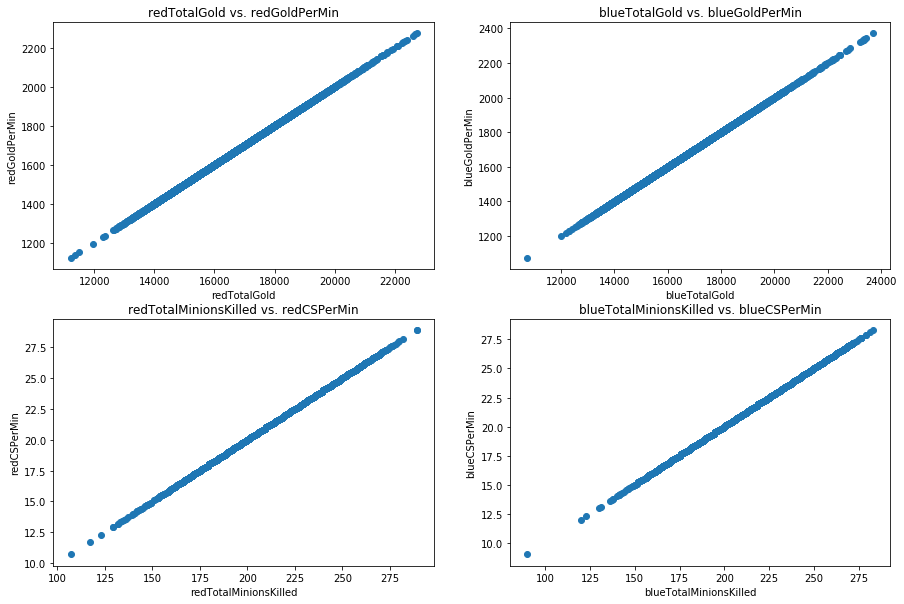

In [24]:
fig, ax = plt.subplots(2, 2, figsize=(15, 10))


ax[0,0].scatter('redTotalGold','redGoldPerMin', data=data)
ax[0,0].set_title('redTotalGold vs. redGoldPerMin')
ax[0,0].set_ylabel('redGoldPerMin')
ax[0,0].set_xlabel('redTotalGold')

ax[0,1].scatter('blueTotalGold','blueGoldPerMin', data=data)
ax[0,1].set_title('blueTotalGold vs. blueGoldPerMin')
ax[0,1].set_ylabel('blueGoldPerMin')
ax[0,1].set_xlabel('blueTotalGold')

ax[1,0].scatter('redTotalMinionsKilled','redCSPerMin', data=data)
ax[1,0].set_title('redTotalMinionsKilled vs. redCSPerMin')
ax[1,0].set_ylabel('redCSPerMin')
ax[1,0].set_xlabel('redTotalMinionsKilled')

ax[1,1].scatter('blueTotalMinionsKilled','blueCSPerMin', data=data)
ax[1,1].set_title('blueTotalMinionsKilled vs. blueCSPerMin')
ax[1,1].set_ylabel('blueCSPerMin')
ax[1,1].set_xlabel('blueTotalMinionsKilled')

plt.show()

In [25]:
data= data.drop(columns = ['redGoldPerMin', 'blueGoldPerMin', 'redCSPerMin', 'blueCSPerMin' ])

In [26]:
data[['blueGoldDiff', 'redGoldDiff']]

,blueGoldDiff,redGoldDiff
0,643,-643
1,-2908,2908
2,-1172,1172
3,-1321,1321
4,-1004,1004
...,...,...
9874,2519,-2519
9875,782,-782
9876,-2416,2416
9877,-839,839


In [27]:
data[['blueExperienceDiff', 'redExperienceDiff']]

,blueExperienceDiff,redExperienceDiff
0,-8,8
1,-1173,1173
2,-1033,1033
3,-7,7
4,230,-230
...,...,...
9874,2469,-2469
9875,888,-888
9876,-1877,1877
9877,-1085,1085


In [28]:
print((data['redEliteMonsters'] == (data['redDragons'] + data['redHeralds'])).value_counts())
print((data['blueEliteMonsters'] == (data['blueDragons'] + data['blueHeralds'])).value_counts())
print((data['blueGoldDiff'] == (data['blueTotalGold'] - data['redTotalGold'])).value_counts())
print((data['redGoldDiff'] == (data['redTotalGold'] - data['blueTotalGold'])).value_counts())
print((data['blueExperienceDiff'] == (data['blueTotalExperience'] - data['redTotalExperience'])).value_counts())
print((data['redExperienceDiff'] == (data['redTotalExperience'] - data['blueTotalExperience'])).value_counts())

True    9879
dtype: int64
True    9879
dtype: int64
True    9879
dtype: int64
True    9879
dtype: int64
True    9879
dtype: int64
True    9879
dtype: int64


In [29]:
data= data.drop(columns = ['blueGoldDiff', 'redGoldDiff', 'blueExperienceDiff', 'redExperienceDiff', 'redEliteMonsters', 'blueEliteMonsters'])

In [30]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9879 entries, 0 to 9878
Data columns (total 26 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   blueWins                      9879 non-null   int64  
 1   blueWardsPlaced               9879 non-null   int64  
 2   blueWardsDestroyed            9879 non-null   int64  
 3   blueFirstBlood                9879 non-null   int64  
 4   blueKills                     9879 non-null   int64  
 5   blueDeaths                    9879 non-null   int64  
 6   blueAssists                   9879 non-null   int64  
 7   blueDragons                   9879 non-null   int64  
 8   blueHeralds                   9879 non-null   int64  
 9   blueTowersDestroyed           9879 non-null   int64  
 10  blueTotalGold                 9879 non-null   int64  
 11  blueAvgLevel                  9879 non-null   float64
 12  blueTotalExperience           9879 non-null   int64  
 13  blu

In [31]:
correlation = data.corr()
correlation['blueWins'].sort_values(ascending=False)

blueWins                        1.000000
blueTotalGold                   0.417213
blueTotalExperience             0.396141
blueAvgLevel                    0.357820
blueKills                       0.337358
blueAssists                     0.276685
blueTotalMinionsKilled          0.224909
blueDragons                     0.213768
blueFirstBlood                  0.201769
blueTotalJungleMinionsKilled    0.131445
blueTowersDestroyed             0.115566
blueHeralds                     0.092385
blueWardsDestroyed              0.044247
blueWardsPlaced                 0.000087
redWardsPlaced                 -0.023671
redWardsDestroyed              -0.055400
redHeralds                     -0.097172
redTowersDestroyed             -0.103696
redTotalJungleMinionsKilled    -0.110994
redDragons                     -0.209516
redTotalMinionsKilled          -0.212171
redAssists                     -0.271047
blueDeaths                     -0.339297
redAvgLevel                    -0.352127
redTotalExperien

### Identify missing data if any

In [32]:
data.describe()

,blueWins,blueWardsPlaced,blueWardsDestroyed,blueFirstBlood,blueKills,blueDeaths,blueAssists,blueDragons,blueHeralds,blueTowersDestroyed,...,redWardsDestroyed,redAssists,redDragons,redHeralds,redTowersDestroyed,redTotalGold,redAvgLevel,redTotalExperience,redTotalMinionsKilled,redTotalJungleMinionsKilled
count,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,...,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000,9879.000000
mean,0.499038,22.288288,2.824881,0.504808,6.183925,6.137666,6.645106,0.361980,0.187974,0.051422,...,2.723150,6.662112,0.413098,0.160036,0.043021,16489.041401,6.925316,17961.730438,217.349226,51.313088
std,0.500024,18.019177,2.174998,0.500002,3.011028,2.933818,4.064520,0.480597,0.390712,0.244369,...,2.138356,4.060612,0.492415,0.366658,0.216900,1490.888406,0.305311,1198.583912,21.911668,10.027885
min,0.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,11212.000000,4.800000,10465.000000,107.000000,4.000000
25%,0.000000,14.000000,1.000000,0.000000,4.000000,4.000000,4.000000,0.000000,0.000000,0.000000,...,1.000000,4.000000,0.000000,0.000000,0.000000,15427.500000,6.800000,17209.500000,203.000000,44.000000
50%,0.000000,16.000000,3.000000,1.000000,6.000000,6.000000,6.000000,0.000000,0.000000,0.000000,...,2.000000,6.000000,0.000000,0.000000,0.000000,16378.000000,7.000000,17974.000000,218.000000,51.000000
75%,1.000000,20.000000,4.000000,1.000000,8.000000,8.000000,9.000000,1.000000,0.000000,0.000000,...,4.000000,9.000000,1.000000,0.000000,0.000000,17418.500000,7.200000,18764.500000,233.000000,57.000000
max,1.000000,250.000000,27.000000,1.000000,22.000000,22.000000,29.000000,1.000000,1.000000,4.000000,...,24.000000,28.000000,1.000000,1.000000,2.000000,22732.000000,8.200000,22269.000000,289.000000,92.000000


In [33]:
data.isnull().sum()

blueWins                        0
blueWardsPlaced                 0
blueWardsDestroyed              0
blueFirstBlood                  0
blueKills                       0
blueDeaths                      0
blueAssists                     0
blueDragons                     0
blueHeralds                     0
blueTowersDestroyed             0
blueTotalGold                   0
blueAvgLevel                    0
blueTotalExperience             0
blueTotalMinionsKilled          0
blueTotalJungleMinionsKilled    0
redWardsPlaced                  0
redWardsDestroyed               0
redAssists                      0
redDragons                      0
redHeralds                      0
redTowersDestroyed              0
redTotalGold                    0
redAvgLevel                     0
redTotalExperience              0
redTotalMinionsKilled           0
redTotalJungleMinionsKilled     0
dtype: int64

In [34]:
data.head()

,blueWins,blueWardsPlaced,blueWardsDestroyed,blueFirstBlood,blueKills,blueDeaths,blueAssists,blueDragons,blueHeralds,blueTowersDestroyed,...,redWardsDestroyed,redAssists,redDragons,redHeralds,redTowersDestroyed,redTotalGold,redAvgLevel,redTotalExperience,redTotalMinionsKilled,redTotalJungleMinionsKilled
0,0,28,2,1,9,6,11,0,0,0,...,6,8,0,0,0,16567,6.8,17047,197,55
1,0,12,1,0,5,5,5,0,0,0,...,1,2,1,1,1,17620,6.8,17438,240,52
2,0,15,0,0,7,11,4,1,0,0,...,3,14,0,0,0,17285,6.8,17254,203,28
3,0,43,1,0,4,5,5,0,1,0,...,2,10,0,0,0,16478,7.0,17961,235,47
4,0,75,4,0,6,6,6,0,0,0,...,2,7,1,0,0,17404,7.0,18313,225,67


In [35]:
# If element has complex type with zero complex part, the return value for that element is True.
# since our data contain numeric data
data.applymap(np.isreal).all()

blueWins                        True
blueWardsPlaced                 True
blueWardsDestroyed              True
blueFirstBlood                  True
blueKills                       True
blueDeaths                      True
blueAssists                     True
blueDragons                     True
blueHeralds                     True
blueTowersDestroyed             True
blueTotalGold                   True
blueAvgLevel                    True
blueTotalExperience             True
blueTotalMinionsKilled          True
blueTotalJungleMinionsKilled    True
redWardsPlaced                  True
redWardsDestroyed               True
redAssists                      True
redDragons                      True
redHeralds                      True
redTowersDestroyed              True
redTotalGold                    True
redAvgLevel                     True
redTotalExperience              True
redTotalMinionsKilled           True
redTotalJungleMinionsKilled     True
dtype: bool

In [36]:
data.applymap(lambda x: isinstance(x, (int, float))).all()

blueWins                        True
blueWardsPlaced                 True
blueWardsDestroyed              True
blueFirstBlood                  True
blueKills                       True
blueDeaths                      True
blueAssists                     True
blueDragons                     True
blueHeralds                     True
blueTowersDestroyed             True
blueTotalGold                   True
blueAvgLevel                    True
blueTotalExperience             True
blueTotalMinionsKilled          True
blueTotalJungleMinionsKilled    True
redWardsPlaced                  True
redWardsDestroyed               True
redAssists                      True
redDragons                      True
redHeralds                      True
redTowersDestroyed              True
redTotalGold                    True
redAvgLevel                     True
redTotalExperience              True
redTotalMinionsKilled           True
redTotalJungleMinionsKilled     True
dtype: bool

In [37]:
data.columns

Index(['blueWins', 'blueWardsPlaced', 'blueWardsDestroyed', 'blueFirstBlood',
       'blueKills', 'blueDeaths', 'blueAssists', 'blueDragons', 'blueHeralds',
       'blueTowersDestroyed', 'blueTotalGold', 'blueAvgLevel',
       'blueTotalExperience', 'blueTotalMinionsKilled',
       'blueTotalJungleMinionsKilled', 'redWardsPlaced', 'redWardsDestroyed',
       'redAssists', 'redDragons', 'redHeralds', 'redTowersDestroyed',
       'redTotalGold', 'redAvgLevel', 'redTotalExperience',
       'redTotalMinionsKilled', 'redTotalJungleMinionsKilled'],
      dtype='object')

### outliers

In [38]:
columns = ['blueWardsPlaced', 'blueWardsDestroyed', 'blueKills', 'blueDeaths', 'blueAssists', 'blueHeralds',
       'blueTowersDestroyed', 'blueTotalGold', 'blueAvgLevel',
       'blueTotalExperience', 'blueTotalMinionsKilled',
       'blueTotalJungleMinionsKilled', 'redWardsPlaced', 'redWardsDestroyed',
       'redAssists', 'redHeralds', 'redTowersDestroyed',
       'redTotalGold', 'redAvgLevel', 'redTotalExperience',
       'redTotalMinionsKilled', 'redTotalJungleMinionsKilled']

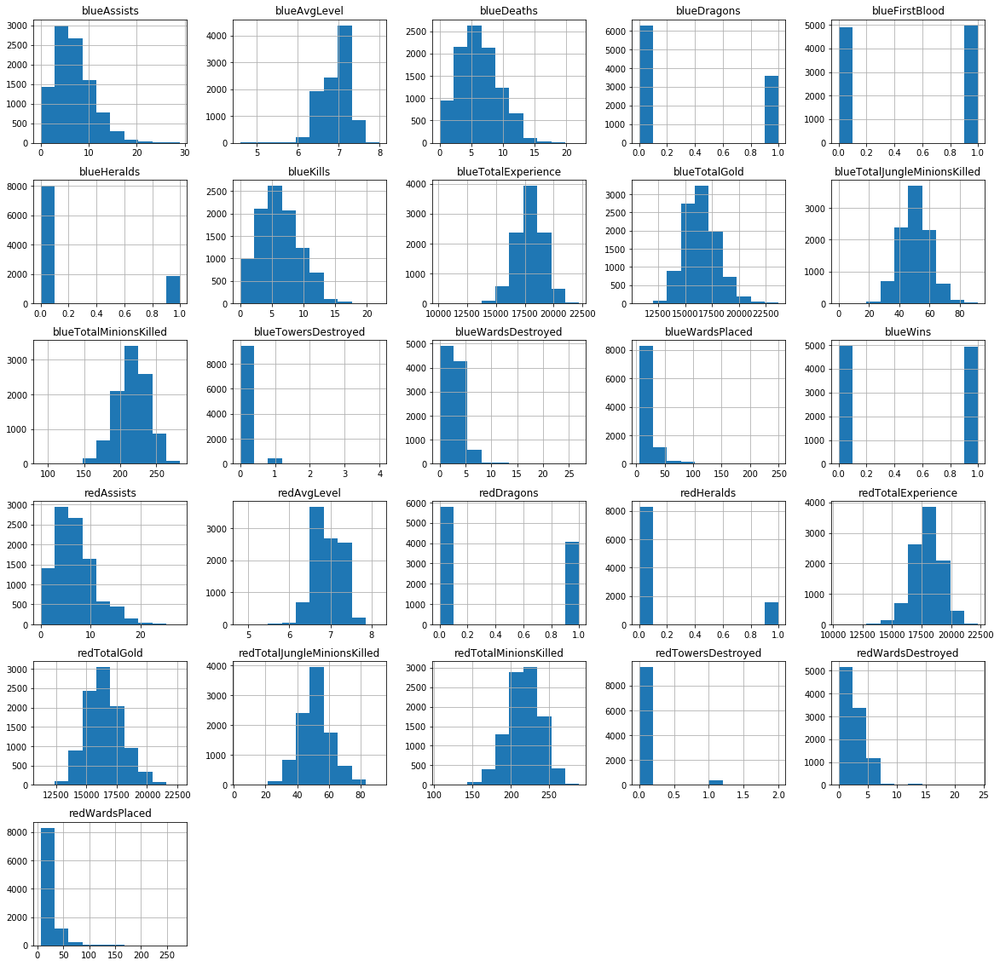

In [39]:
data.hist(figsize=(20, 20))
plt.show()

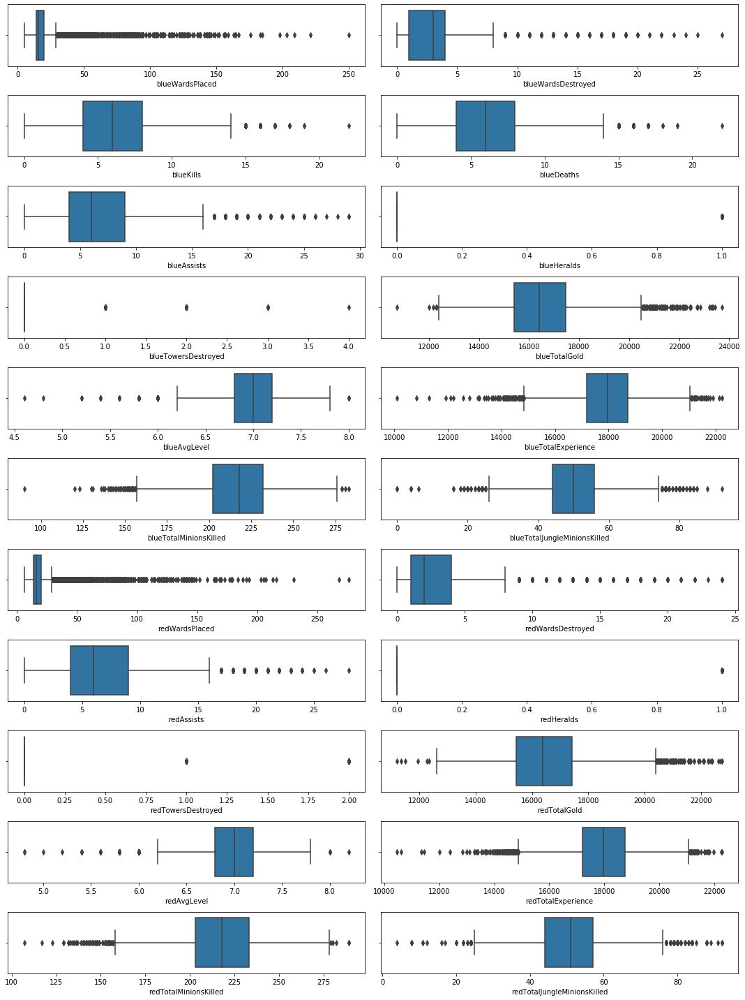

In [40]:
row = (len(columns)/2)
plt.figure(figsize = (15, 20))

for i, col in enumerate(columns):
    plt.subplot(row, 2, i +1)
    sns.boxplot(data[col])

plt.tight_layout()

In [45]:
col = [ 'blueWardsPlaced', 'blueWardsDestroyed', 'blueFirstBlood',
       'blueKills', 'blueDeaths', 'blueAssists', 'blueDragons', 'blueHeralds',
       'blueTowersDestroyed', 'blueTotalGold', 'blueAvgLevel',
       'blueTotalExperience', 'blueTotalMinionsKilled',
       'blueTotalJungleMinionsKilled', 'redWardsPlaced', 'redWardsDestroyed',
       'redAssists', 'redDragons', 'redHeralds', 'redTowersDestroyed',
       'redTotalGold', 'redAvgLevel', 'redTotalExperience',
       'redTotalMinionsKilled', 'redTotalJungleMinionsKilled']

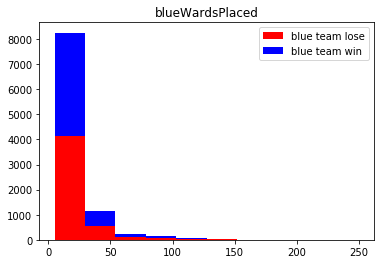

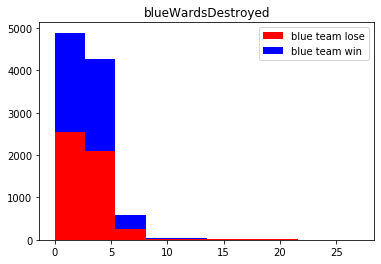

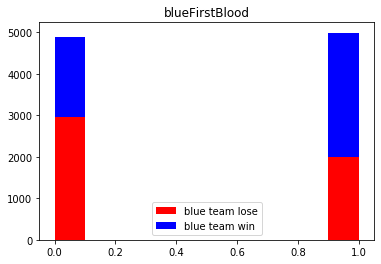

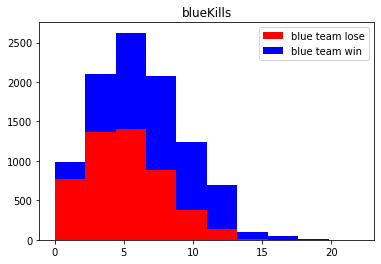

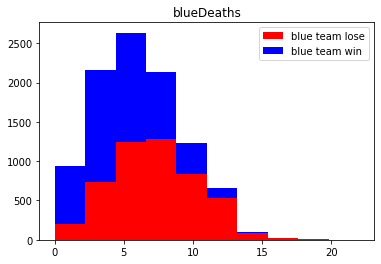

...

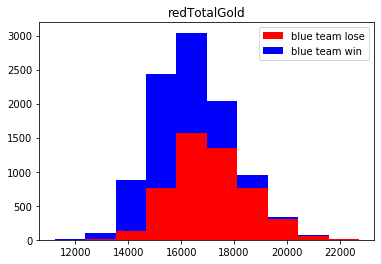

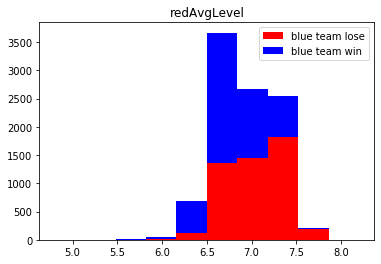

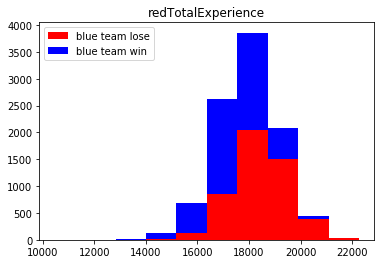

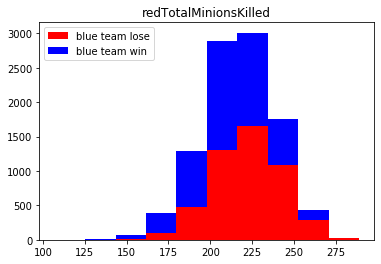

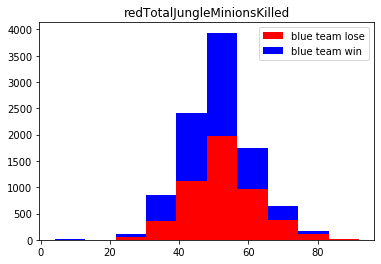

In [52]:
for cols in col:
    x1 = list(data[data['blueWins'] == 0][cols])
    x2 = list(data[data['blueWins'] == 1][cols])
    colors = ['red', 'blue']
    names = ['blue team lose', 'blue team win']
         
    # Make the histogram using a list of lists
    # Normalize the flights and assign colors and names
    plt.hist([x1, x2], color = colors, stacked=True, label=names)
    plt.title(cols)

    # Plot formatting
    plt.legend()
    plt.show()

In [67]:
col = [ 'blueWardsPlaced', 'blueWardsDestroyed', 'blueFirstBlood',
       'blueKills', 'blueDeaths', 'blueAssists', 'blueDragons','blueTotalGold', 'blueAvgLevel',
       'blueTotalExperience', 'blueTotalMinionsKilled',
       'blueTotalJungleMinionsKilled', 'redWardsPlaced', 'redWardsDestroyed',
       'redAssists',
       'redTotalGold', 'redAvgLevel', 'redTotalExperience',
       'redTotalMinionsKilled', 'redTotalJungleMinionsKilled']

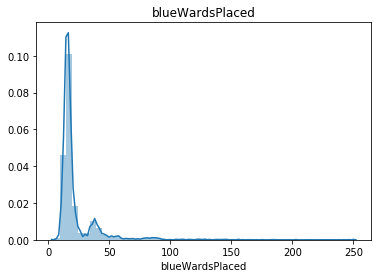

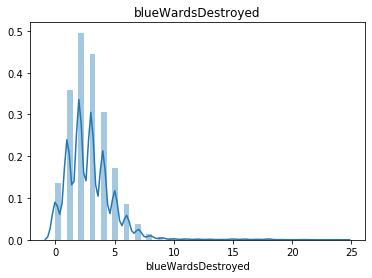

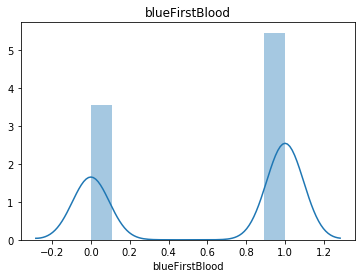

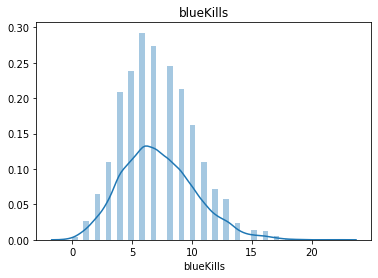

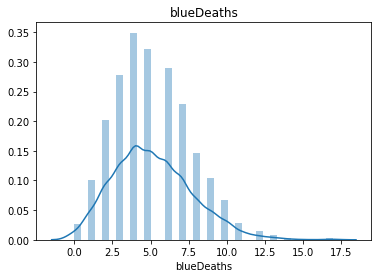

...

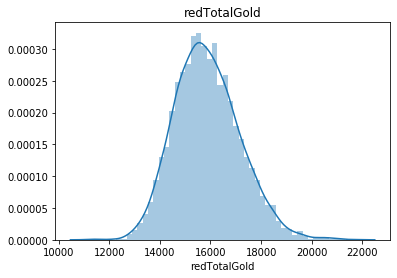

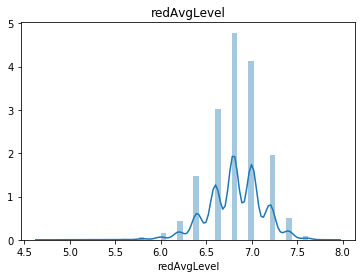

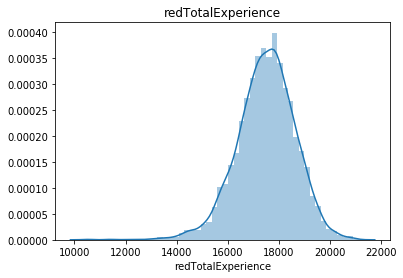

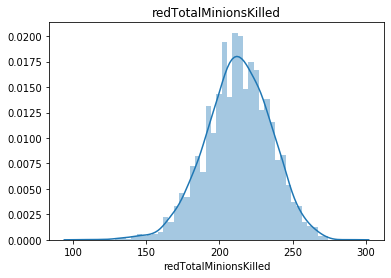

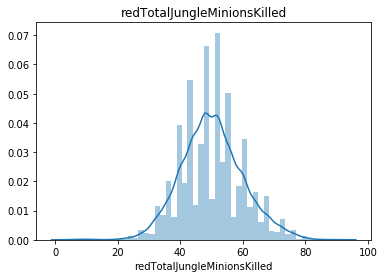

In [68]:
for cols in col:

    subset = data[data['blueWins'] == 1]
    
    # Draw the density plot
    sns.distplot(subset[cols],hist=True)
    plt.title(cols)
    plt.show()


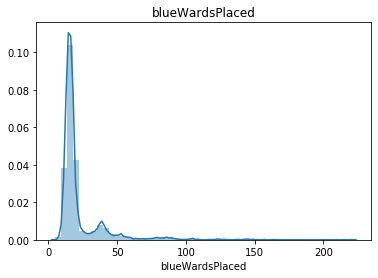

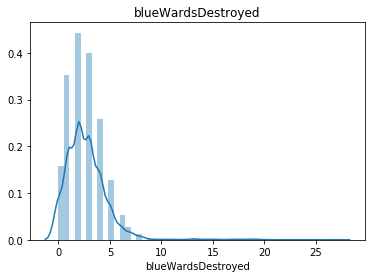

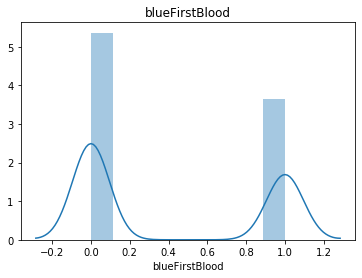

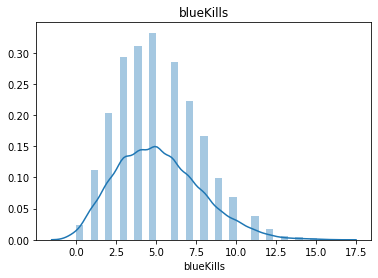

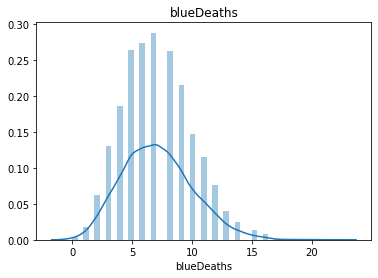

...

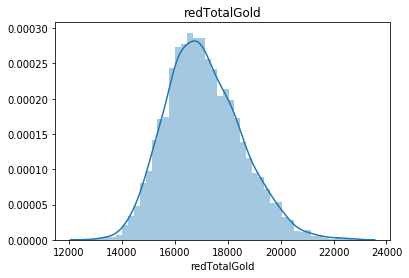

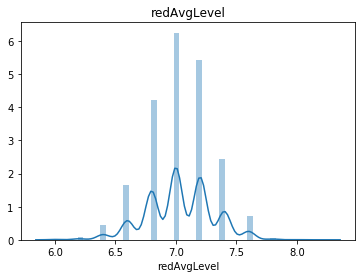

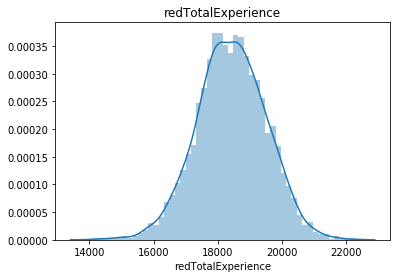

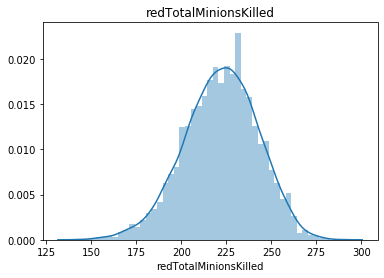

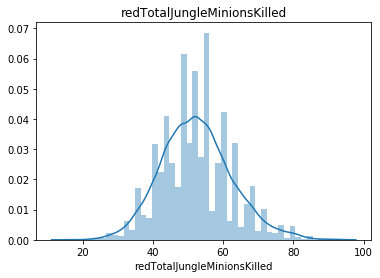

In [78]:
for cols in col:

    subset = data[data['blueWins'] == 0]
    
    # Draw the density plot
    sns.distplot(subset[cols],hist=True)
    plt.title(cols)
    plt.show()